# New Section

Data Shape: (569, 32)

Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave_points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float

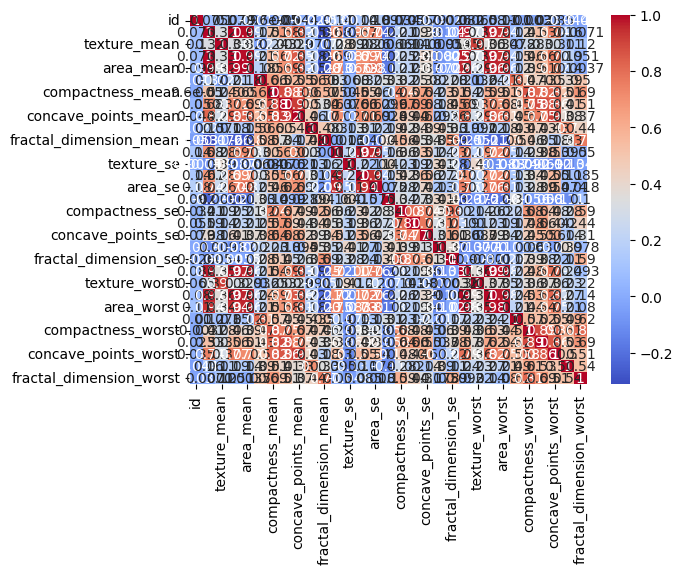

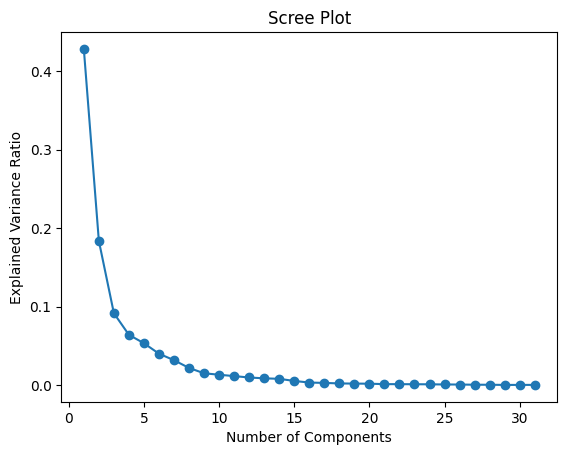


Factor Loadings:
                              PC1       PC2
id                       0.022912 -0.034068
radius_mean              0.218913 -0.233271
texture_mean             0.103844 -0.060044
perimeter_mean           0.227535 -0.214589
area_mean                0.221046 -0.230669
smoothness_mean          0.142415  0.186422
compactness_mean         0.239067  0.152455
concavity_mean           0.258280  0.060542
concave_points_mean      0.260738 -0.034167
symmetry_mean            0.137978  0.190685
fractal_dimension_mean   0.064148  0.366531
radius_se                0.206117 -0.105936
texture_se               0.017413  0.089548
perimeter_se             0.211447 -0.089807
area_se                  0.203076 -0.152771
smoothness_se            0.014678  0.203190
compactness_se           0.170288  0.232503
concavity_se             0.153544  0.196846
concave_points_se        0.183407  0.129965
symmetry_se              0.042416  0.183559
fractal_dimension_se     0.102496  0.279584
radius_worst  

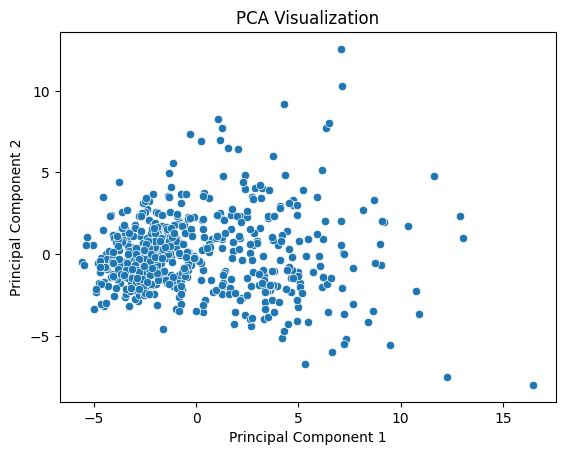

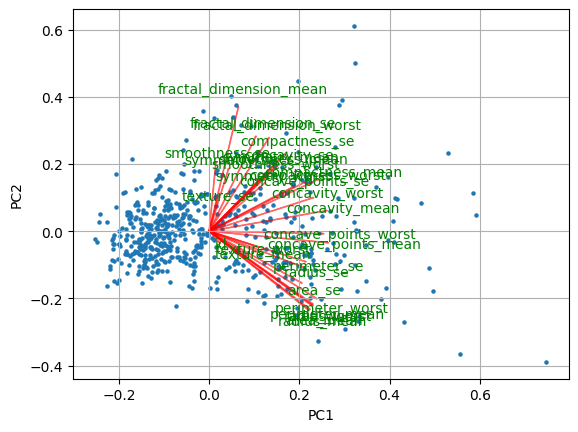

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# i) Load dataset and EDA
data = pd.read_csv('data.csv')  # Replace with your file
print("Data Shape:", data.shape)
print("\nData Info:")
print(data.info())
print("\nDescriptive Statistics:")
print(data.describe())

# Pairplot for EDA
sns.pairplot(data)  # Create pairplot
plt.show()

# Select only numerical features for correlation matrix
numerical_data = data.select_dtypes(include=np.number)

# Correlation matrix
correlation_matrix = numerical_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

# ii) Data standardization
X = numerical_data  # Use numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# iii) & iv) Eigen decomposition
covariance_matrix = np.cov(X_scaled.T)
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)

# v) Selecting principal components
explained_variance_ratio = eigen_values / np.sum(eigen_values)
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Scree plot (Metric i)
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot')
plt.show()

# vi) PCA with scikit-learn
pca = PCA(n_components=2)  # Choose the number of components
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Factor loadings (Metric ii)
factor_loadings = pd.DataFrame(pca.components_.T, index=X.columns, columns=['PC1', 'PC2'])
print("\nFactor Loadings:")
print(factor_loadings)

# Visualize PCA results
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization')
plt.show()

# Biplot
def biplot(score, coeff, labels=None):
    xs = score[:, 0]
    ys = score[:, 1]
    n = coeff.shape[0]
    scalex = 1.0 / (xs.max() - xs.min())
    scaley = 1.0 / (ys.max() - ys.min())
    plt.scatter(xs * scalex, ys * scaley, s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='r', alpha=0.5)
        if labels is None:
            plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, "Var" + str(i + 1), color='green', ha='center', va='center')
        else:
            plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, labels[i], color='g', ha='center', va='center')

    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

# Call the biplot function
biplot(principal_components[:, 0:2], np.transpose(pca.components_[0:2, :]), labels=X.columns)
plt.show()

